# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
from cmfrec import CMF
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

# Data Formatting

In [ ]:
movies = pd.read_fwf('zee-movies.dat', encoding='ISO-8859-1')
print(movies.shape)
movies.head()

(3883, 3)


,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [ ]:
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)

delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']

movies.rename(columns={'Movie ID':'MovieID'}, inplace=True)
movies1=movies.copy()
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [ ]:
ratings = pd.read_fwf('zee-ratings.dat', encoding='ISO-8859-1')


In [ ]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']

print(ratings.shape)
ratings1=ratings.copy()
ratings.head()

(1000209, 4)


,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [ ]:
users = pd.read_fwf('zee-users.dat', encoding='ISO-8859-1')


In [ ]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']
users1=users.copy()

In [ ]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

In [ ]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [ ]:
print(users.shape)
users.head()

(6040, 5)


,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,k-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


# Exploratory Data Analysis

In [ ]:
movies['Year'] = movies.Title.str.extract('(\(\d\d\d\d\))',expand=False)

movies['Year'] = movies.Year.str.extract('(\d\d\d\d)',expand=False)

movies['Title'] = movies.Title.str.replace('(\(\d\d\d\d\))', '')

movies['Title'] = movies['Title'].apply(lambda x: x.strip())
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story (1995),Animation|Children's|Comedy,1995
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


In [ ]:
dfmov = movies.copy()
dfmov.dropna(inplace=True)
dfmov.Genres = dfmov.Genres.str.split('|')
dfmov['Genres'] = dfmov['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])
for i in dfmov['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'
dfmov.head()

,MovieID,Title,Genres,Year
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]",1995
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",1995
3,4,Waiting to Exhale (1995),"[Comedy, Drama]",1995
4,5,Father of the Bride Part II (1995),[Comedy],1995


## Merge all above dataframes

In [ ]:
df_1 = pd.merge(dfmov, ratings, how='inner', on='MovieID')
df_1.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,1,5,978824268
1,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,6,4,978237008
2,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,8,4,978233496
3,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,9,5,978225952
4,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,10,5,978226474


In [ ]:
data = pd.merge(df_1, users, how='inner', on='UserID')
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067
1,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117
2,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413
3,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614
4,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370


In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   MovieID     996144 non-null  object
 1   Title       996144 non-null  object
 2   Genres      996144 non-null  object
 3   Year        996144 non-null  object
 4   UserID      996144 non-null  object
 5   Rating      996144 non-null  object
 6   Timestamp   996144 non-null  object
 7   Gender      996144 non-null  object
 8   Age         996144 non-null  object
 9   Occupation  996144 non-null  object
 10  Zip-code    996144 non-null  object
dtypes: object(11)
memory usage: 83.6+ MB


## Missing Values

In [ ]:
missing_value = pd.DataFrame({
    'Missing Value': data.isnull().sum(),
    'Percentage': (data.isnull().sum() / len(data))*100
})

In [ ]:
missing_value.sort_values(by='Percentage', ascending=False)


,Missing Value,Percentage
MovieID,0,0.00
Title,0,0.00
Genres,0,0.00
Year,0,0.00
UserID,0,0.00
Rating,0,0.00
Timestamp,0,0.00
Gender,0,0.00
Age,0,0.00
Occupation,0,0.00


## Feature Engineering

In [ ]:
data['Datetime'] = pd.to_datetime(data['Timestamp'], unit='s')
data['Year']=data['Year'].astype('int32')
data['Rating']=data['Rating'].astype('int32')

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   MovieID     996144 non-null  object        
 1   Title       996144 non-null  object        
 2   Genres      996144 non-null  object        
 3   Year        996144 non-null  int32         
 4   UserID      996144 non-null  object        
 5   Rating      996144 non-null  int32         
 6   Timestamp   996144 non-null  object        
 7   Gender      996144 non-null  object        
 8   Age         996144 non-null  object        
 9   Occupation  996144 non-null  object        
 10  Zip-code    996144 non-null  object        
 11  Datetime    996144 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(2), object(9)
memory usage: 83.6+ MB


In [ ]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseDec'] = pd.cut(data['Year'], bins=bins, labels=labels)

data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseDec
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,90s
1,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,90s
2,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,90s
3,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,90s
4,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,90s


# Understanding the Dataset

Average User Ratings

In [ ]:
user_ratings =data[['UserID','Rating']].groupby('UserID').mean()

Text(0, 0.5, 'Frequency')

<Figure size 800x800 with 0 Axes>

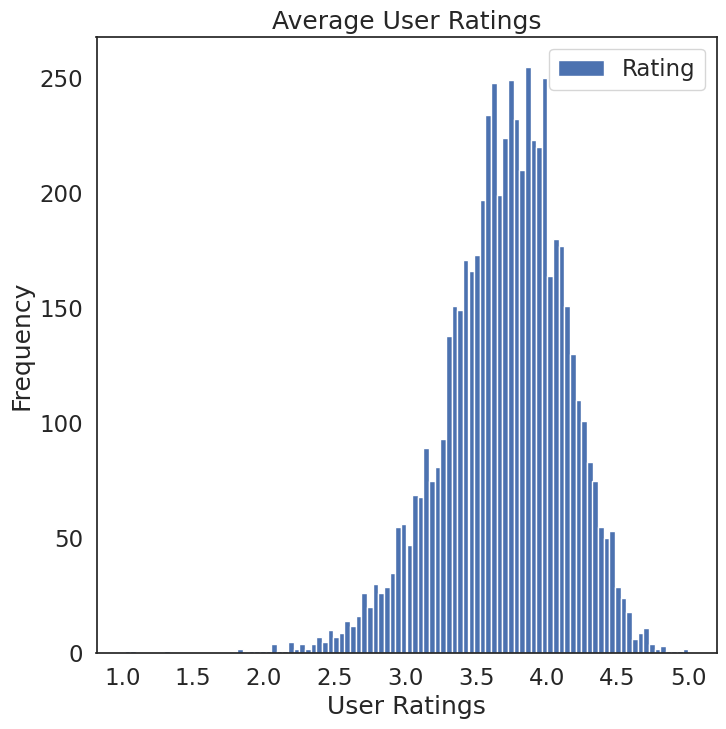

In [ ]:
fig = plt.figure(figsize = (8,8))
user_ratings.plot(kind = 'hist', bins = 100, figsize = (8,8))
plt.plot()
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')

Movies are rated 3.5–4 by average, users are less likely to give a film a rating lower than 3 if they didn't enjoy it.

No.of movies by Release year.

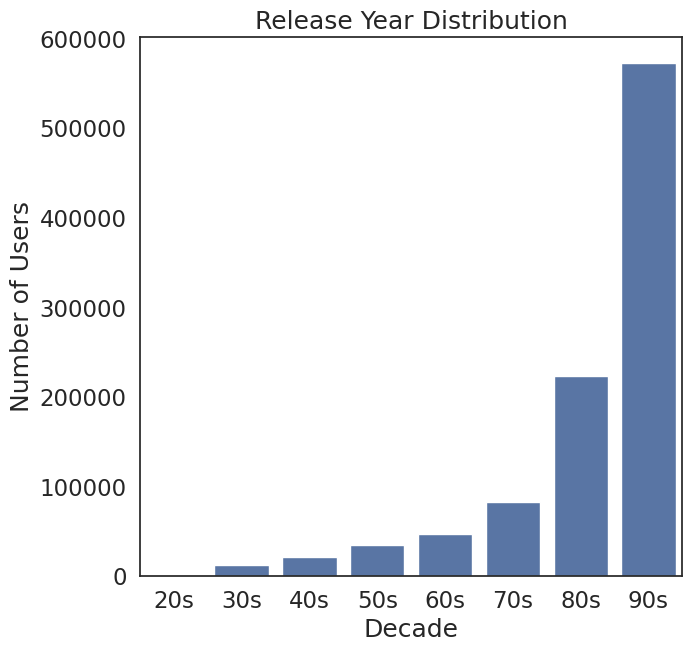

In [ ]:
plt.figure(figsize=(7, 7))
sns.countplot(x='ReleaseDec', data=data)
plt.title('Release Year Distribution')
plt.xlabel('Decade')
plt.ylabel('Number of Users')
plt.show()


Most of the movies present in the dataset were released in the year 90s.

In [ ]:
l = dfmov.Genres.iloc[:5]


In [ ]:
pd.get_dummies(l.apply(pd.Series).stack()).groupby(level=0).sum()


,Adventure,Animation,Children's,Comedy,Drama,Fantasy,Romance
0,0,1,1,1,0,0,0
1,1,0,1,0,0,1,0
2,0,0,0,1,0,0,1
3,0,0,0,1,1,0,0
4,0,0,0,1,0,0,0


In [ ]:
pd.Series(l.iloc[0])


,0
0,Animation
1,Children's
2,Comedy


In [ ]:
dfmov.head(2)


,MovieID,Title,Genres,Year
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]",1995


Top 10 Genres based on movies count

In [ ]:
genres_df = (
    pd.get_dummies(dfmov['Genres'].apply(pd.Series).stack())
    .groupby(level=0)
    .sum()
)


In [ ]:
test = genres_df.iloc[:,0:].sum()
test=test.iloc[1:]
print(test)

Action          501
Adventure       282
Animation       104
Children's      249
Comedy         1189
Crime           210
Documentary     124
Drama          1582
Fantasy          62
Film-Noir        44
Horror          340
Musical         113
Mystery         105
Romance         462
Sci-Fi          265
Thriller        488
War             139
Western          68
dtype: int64


In [ ]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))

test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


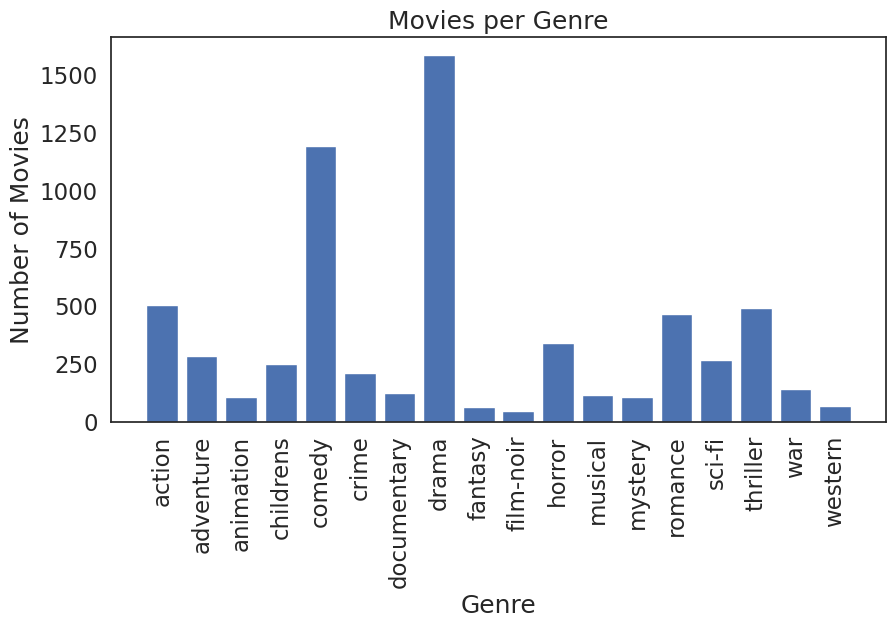

In [ ]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical', 'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2)
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

most the movies in the dataset belongs to Comedy and Drama genres.

Distribution by Age

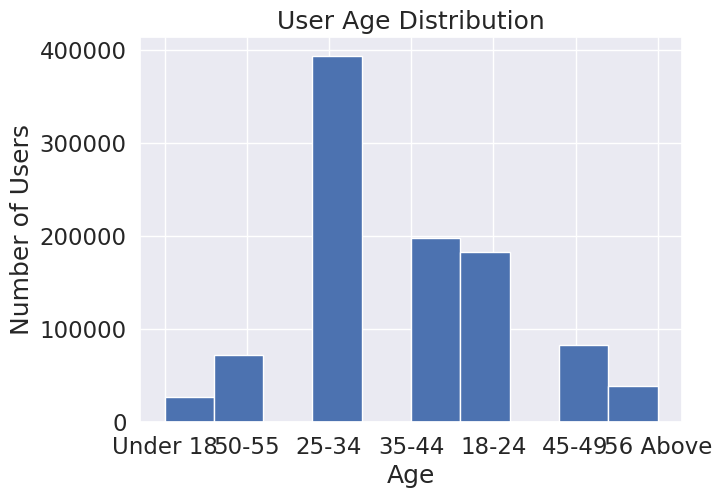

In [ ]:
data['Age'].hist(figsize=(7, 5))
plt.title('User Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

 25-34 age group have watched and rated the most number of movies

Distribution by Gender

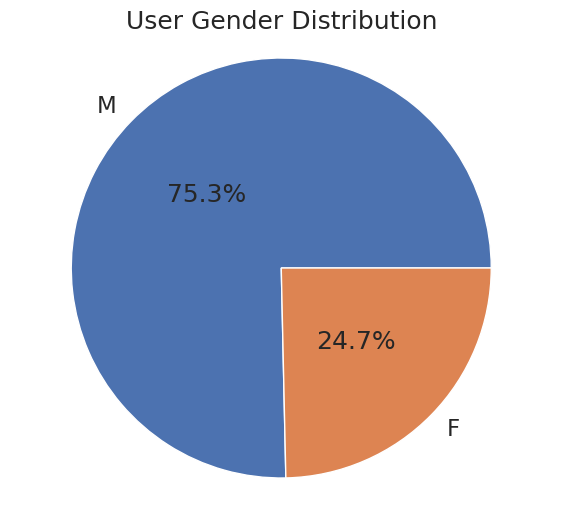

In [ ]:
x = data['Gender'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=['M','F'], autopct='%1.1f%%', pctdistance=0.5)
plt.title('User Gender Distribution')
plt.axis('equal')
plt.show()

most of the users in our dataset who’ve rated the movies are Male.

Distribution by Occupation

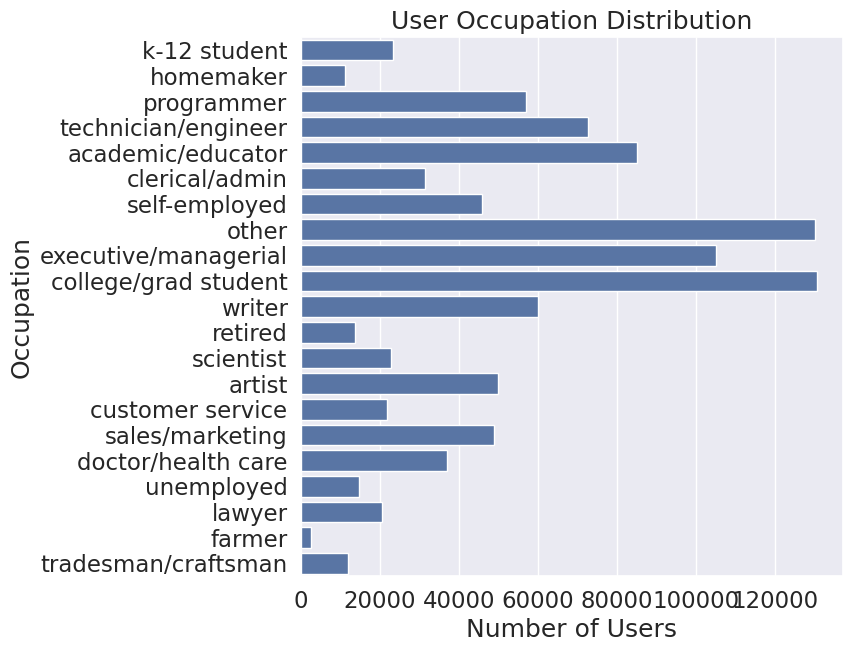

In [ ]:
plt.figure(figsize=(7, 7))
sns.countplot(y='Occupation', data=data)
plt.title('User Occupation Distribution')
plt.xlabel('Number of Users')
plt.ylabel('Occupation')
plt.show()

users belonging to college/grad student profession have watched and rated the most movies.

Text(0, 0.5, 'User Rating count')

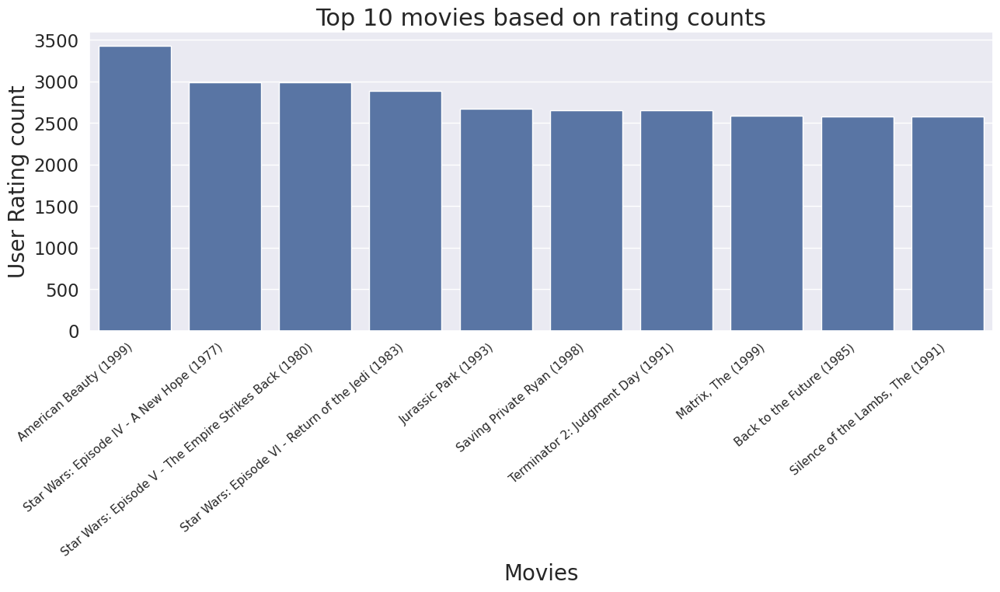

In [ ]:
movies_rating_count = data.groupby(by = ['Title'])['Rating'].count().reset_index()[['Title', 'Rating']] ## Counting the ratings based on movies
movies_rating_count.rename(columns = {'Rating': 'totalRatingCount'},inplace=True)

top10_movies=movies_rating_count[['Title', 'totalRatingCount']].sort_values(by = 'totalRatingCount',ascending = False).head(10)

plt.figure(figsize=(15,5))
ax=sns.barplot(x="Title", y="totalRatingCount", data=top10_movies)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 movies based on rating counts',fontsize = 22)
ax.set_xlabel('Movies',fontsize = 20)
ax.set_ylabel('User Rating count', fontsize = 20)

movie with maximum number of ratings is American Beauty.

# Recommendations systems

User-Interaction Matrix

In [ ]:
matrix = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
matrix.fillna(0, inplace=True)

print(matrix.shape)

matrix.head(10)

(6040, 3682)


Title   $1,000,000 Duck (1971)  'Night Mother (1986)  \
UserID                                                 
1                         0.00                  0.00   
10                        0.00                  0.00   
100                       0.00                  0.00   
1000                      0.00                  0.00   
1001                      0.00                  0.00   
1002                      0.00                  0.00   
1003                      0.00                  0.00   
1004                      0.00                  0.00   
1005                      0.00                  0.00   
1006                      0.00                  0.00   

Title   'Til There Was You (1997)  'burbs, The (1989)  \
UserID                                                  
1                            0.00                0.00   
10                           0.00                4.00   
100                          0.00                0.00   
1000                         0.00                0.00   
1001                         0.00                0.00   
1002                         0.00                0.00   
1003                         0.00                0.00   
1004                         0.00                0.00   
1005                         0.00                0.00   
1006                         0.00                0.00   

Title   ...And Justice for All (1979)  1-900 (1994)  \
UserID                                                
1                                0.00          0.00   
10                               0.00          0.00   
100                              0.00          0.00   
1000                             0.00          0.00   
1001                             0.00          0.00   
1002                             0.00          0.00   
1003                             0.00          0.00   
1004                             0.00          0.00   
1005                             0.00          0.00   
1006                             0.00          0.00   

Title   10 Things I Hate About You (1999)  101 Dalmatians (1961)  \
UserID                                                             
1                                    0.00                   0.00   
10                                   0.00                   0.00   
100                                  0.00                   0.00   
1000                                 0.00                   4.00   
1001                                 0.00                   0.00   
1002                                 0.00                   0.00   
1003                                 0.00                   0.00   
1004                                 0.00                   4.00   
1005                                 0.00                   0.00   
1006                                 0.00                   0.00   

Title   101 Dalmatians (1996)  12 Angry Men (1957)  13th Warrior, The (1999)  \
UserID                                                                         
1                        0.00                 0.00                      0.00   
10                       0.00                 3.00                      4.00   
100                      0.00                 0.00                      0.00   
1000                     0.00                 0.00                      0.00   
1001                     3.00                 0.00                      0.00   
1002                     0.00                 0.00                      0.00   
1003                     0.00                 0.00                      0.00   
1004                     4.00                 0.00                      0.00   
1005                     0.00                 0.00                      0.00   
1006                     0.00                 0.00                      0.00   

Title   187 (1997)  2 Days in the Valley (1996)  20 Dates (1998)  \
UserID                                                             
1             0.00                         0.00             0.00   

In [ ]:
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


Pearson Correlation

Pearson’s Correlation measures the degree of linear relationship between two numeric variables and lies between -1 to +1. It is represented by ‘r’.

r=1 means perfect positive correlation

r=-1 means perfect negative correlation

r=0 means no linear correlation (note, it does not mean no correlation)

Item - Based approach

In [ ]:
data[data['Title']=='Your Friends and Neighbors (1998)']


,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseDec
593665,2165,Your Friends and Neighbors (1998),[Drama],1998,53,5,977985930,M,25-34,other,96931,2000-12-28 06:45:30,90s
593666,2165,Your Friends and Neighbors (1998),[Drama],1998,166,4,977301003,M,18-24,college/grad student,92802,2000-12-20 08:30:03,90s
593667,2165,Your Friends and Neighbors (1998),[Drama],1998,202,3,976937923,M,18-24,college/grad student,53706,2000-12-16 03:38:43,90s
593668,2165,Your Friends and Neighbors (1998),[Drama],1998,331,4,984153827,M,25-34,executive/managerial,55902,2001-03-09 16:03:47,90s
593669,2165,Your Friends and Neighbors (1998),[Drama],1998,345,4,976335081,M,25-34,programmer,94114,2000-12-09 04:11:21,90s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
593769,2165,Your Friends and Neighbors (1998),[Drama],1998,5812,1,957943894,F,25-34,executive/managerial,92120,2000-05-10 07:31:34,90s
593770,2165,Your Friends and Neighbors (1998),[Drama],1998,5852,5,958101742,F,25-34,academic/educator,94044,2000-05-12 03:22:22,90s
593771,2165,Your Friends and Neighbors (1998),[Drama],1998,5880,3,958488023,M,25-34,academic/educator,08904,2000-05-16 14:40:23,90s
593772,2165,Your Friends and Neighbors (1998),[Drama],1998,5985,2,961118038,F,18-24,college/grad student,78705-5221,2000-06-16 01:13:58,90s


In [ ]:
movie_name='Your Friends and Neighbors (1998)'
movie_rating = matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

UserID
1      0.00
10     0.00
100    0.00
1000   0.00
1001   4.00
       ... 
995    0.00
996    0.00
997    0.00
998    0.00
999    1.00
Name: Your Friends and Neighbors (1998), Length: 6040, dtype: float64


In [ ]:
similar_movies = matrix.corrwith(movie_rating)

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True)

sim_df.iloc[1: , :].head()

,Correlation
Title,
In the Company of Men (1997),0.31
Trees Lounge (1996),0.29
Deconstructing Harry (1997),0.28
I Shot Andy Warhol (1996),0.27
"Ice Storm, The (1997)",0.27


Cosine Similarty

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them

The cosine similarity always belongs to the interval [-1,1].

In [ ]:
item_sim = cosine_similarity(matrix.T)
item_sim

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

In [ ]:
item_sim.shape


(3682, 3682)

Item-Based Similarity

In [ ]:
item_sim_matrix = pd.DataFrame(item_sim, index=matrix.columns, columns=matrix.columns)
item_sim_matrix.head()

Title                          $1,000,000 Duck (1971)  'Night Mother (1986)  \
Title                                                                         
$1,000,000 Duck (1971)                           1.00                  0.07   
'Night Mother (1986)                             0.07                  1.00   
'Til There Was You (1997)                        0.04                  0.12   
'burbs, The (1989)                               0.08                  0.12   
...And Justice for All (1979)                    0.06                  0.16   

Title                          'Til There Was You (1997)  'burbs, The (1989)  \
Title                                                                          
$1,000,000 Duck (1971)                              0.04                0.08   
'Night Mother (1986)                                0.12                0.12   
'Til There Was You (1997)                           1.00                0.10   
'burbs, The (1989)                                  0.10                1.00   
...And Justice for All (1979)                       0.07                0.14   

Title                          ...And Justice for All (1979)  1-900 (1994)  \
Title                                                                        
$1,000,000 Duck (1971)                                  0.06          0.00   
'Night Mother (1986)                                    0.16          0.00   
'Til There Was You (1997)                               0.07          0.08   
'burbs, The (1989)                                      0.14          0.00   
...And Justice for All (1979)                           1.00          0.00   

Title                          10 Things I Hate About You (1999)  \
Title                                                              
$1,000,000 Duck (1971)                                      0.06   
'Night Mother (1986)                                        0.08   
'Til There Was You (1997)                                   0.13   
'burbs, The (1989)                                          0.19   
...And Justice for All (1979)                               0.08   

Title                          101 Dalmatians (1961)  101 Dalmatians (1996)  \
Title                                                                         
$1,000,000 Duck (1971)                          0.19                   0.17   
'Night Mother (1986)                            0.15                   0.10   
'Til There Was You (1997)                       0.11                   0.13   
'burbs, The (1989)                              0.25                   0.18   
...And Justice for All (1979)                   0.19                   0.12   

Title                          12 Angry Men (1957)  13th Warrior, The (1999)  \
Title                                                                          
$1,000,000 Duck (1971)                        0.09                      0.06   
'Night Mother (1986)                          0.11                      0.05   
'Til There Was You (1997)                     0.08                      0.07   
'burbs, The (1989)                            0.17                      0.20   
...And Justice for All (1979)                 0.21                      0.12   

Title                          187 (1997)  2 Days in the Valley (1996)  \
Title                                                                    
$1,000,000 Duck (1971)               0.03                         0.02   
'Night Mother (1986)                 0.06                         0.11   
'Til There Was You (1997)            0.02                         0.07   
'burbs, The (1989)                   0.10                         0.18   
...And Justice for All (1979)        0.11                         0.20   

Title                          20 Dates (1998)  \
Title                                            
$1,000,000 Duck (1971)                    0.02   
'Night Mother (1986)                      0.04   
'Til There Was You (1997)  

User-Based Similarity

In [ ]:
user_sim = cosine_similarity(matrix)
user_sim

array([[1.        , 0.25586725, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12205855],
       [0.25586725, 1.        , 0.25863269, ..., 0.16071024, 0.13280705,
        0.24681021],
       [0.12396703, 0.25863269, 1.        , ..., 0.20430203, 0.11352239,
        0.30610356],
       ...,
       [0.15926709, 0.16071024, 0.20430203, ..., 1.        , 0.18657496,
        0.18245166],
       [0.11935626, 0.13280705, 0.11352239, ..., 0.18657496, 1.        ,
        0.10797727],
       [0.12205855, 0.24681021, 0.30610356, ..., 0.18245166, 0.10797727,
        1.        ]])

In [ ]:
user_sim_matrix = pd.DataFrame(user_sim, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.30  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.30  1.00  0.09  0.05  0.20  0.35  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.09  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.14  0.18  0.11   
10      0.12 0.20  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.28  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.19  0.17  0.14  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.11  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.15 0.22   
1000   0.10  0.14  0.17  0.06  0.04  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.12  0.17  0.05  0.18  0.05 0.08  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.14  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.24  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.15  0.27  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.13  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.22  0.19  0.14  0.29  0.34  0.34 0.17  0.10  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.24  0.32  0.21 0.09  0.11  0.05  0.07   
1000    0.02  0.33  0.14  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.14  0.13  0.17  0.04  0.17  0.25  0.24 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.40  0.11 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.18  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.16  0.22  0.28 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

Nearest Neighbors

In [ ]:
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(matrix.T)

NearestNeighbors(metric='cosine')

In [ ]:
distances, indices = model_knn.kneighbors(matrix.T, n_neighbors= 6)


In [ ]:
result = pd.DataFrame(indices, columns=['Title1', 'Title2', 'Title3', 'Title4', 'Title5','Title6'])
result.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,0,738,418,288,3283,586
1,1,810,73,2193,3072,3408
2,2,1642,2561,3359,2620,2021
3,3,1471,2195,1317,1053,3552
4,4,27,729,897,497,948


In [ ]:
result2 = result.copy()
for i in range(1, 7):
    mov = pd.DataFrame(matrix.T.index).reset_index()
    mov = mov.rename(columns={'index':f'Title{i}'})
    result2 = pd.merge(result2, mov, on=[f'Title{i}'], how='left')
    result2 = result2.drop(f'Title{i}', axis=1)
    result2 = result2.rename(columns={'Title':f'Title{i}'})
result2.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,"$1,000,000 Duck (1971)","Computer Wore Tennis Shoes, The (1970)",Blackbeard's Ghost (1968),"Barefoot Executive, The (1971)",That Darn Cat! (1965),Candleshoe (1977)
1,'Night Mother (1986),"Cry in the Dark, A (1988)",Agnes of God (1985),Mommie Dearest (1981),Sophie's Choice (1982),"Trip to Bountiful, The (1985)"
2,'Til There Was You (1997),If Lucy Fell (1996),Picture Perfect (1997),To Gillian on Her 37th Birthday (1996),Practical Magic (1998),Mad Love (1995)
3,"'burbs, The (1989)",Harry and the Hendersons (1987),"Money Pit, The (1986)",Ghostbusters II (1989),European Vacation (1985),Weekend at Bernie's (1989)
4,...And Justice for All (1979),52 Pick-Up (1986),Coma (1978),Deliverance (1972),"Boys from Brazil, The (1978)",Dog Day Afternoon (1975)


In [ ]:
movie_name = 'Mad Love (1995)'
result2.loc[result2['Title1']==movie_name]

,Title1,Title2,Title3,Title4,Title5,Title6
2021,Mad Love (1995),To Gillian on Her 37th Birthday (1996),Music From Another Room (1998),Now and Then (1995),Something to Talk About (1995),"Bye Bye, Love (1995)"


Matrix Factorization

In [ ]:
rm = data.pivot(index = 'UserID', columns ='MovieID', values = 'Rating').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

In [ ]:
user_itm = data[['UserID', 'MovieID', 'Rating']].copy()
user_itm.columns = ['UserId', 'ItemId', 'Rating']
user_itm.head(2)

,UserId,ItemId,Rating
0,1,1,5
1,6,1,4


In [ ]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserId'].unique()))
print("No.of Items:",len(user_itm['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


In [ ]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


In [ ]:
model.A_.shape, model.B_.shape

((6040, 4), (3682, 4))

In [ ]:
user_itm.Rating.mean(), model.glob_mean_

(np.float64(3.57998542379415), 3.5799853801727295)

In [ ]:
user=cosine_similarity(model.A_)

user_sim_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.09  0.36 -0.25  0.72  0.33 -0.01 -0.63 -0.45 -0.57 -0.46   
10     -0.09  1.00 -0.51  0.06  0.58  0.33  0.15 -0.57  0.04  0.78  0.29   
100     0.36 -0.51  1.00  0.66 -0.07  0.49  0.66  0.44  0.45 -0.26  0.13   
1000   -0.25  0.06  0.66  1.00 -0.20  0.54  0.92  0.58  0.89  0.53  0.57   
1001    0.72  0.58 -0.07 -0.20  1.00  0.60 -0.02 -0.88 -0.45  0.05 -0.00   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.42  0.84 -0.03  0.05 -0.49 -0.46  0.10  0.76  0.13 -0.13  0.62   
10      0.37 -0.24  0.83  0.90  0.84  0.54  0.11  0.45  0.50  0.96  0.64   
100     0.59  0.77 -0.01 -0.19 -0.33  0.17  0.43  0.32  0.24 -0.31  0.10   
1000    0.69  0.24  0.51  0.27  0.42  0.84  0.47  0.17  0.47  0.32  0.14   
1001    0.50  0.53  0.56  0.69  0.21 -0.01  0.34  0.91  0.58  0.49  0.84   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.32  0.08  0.60  0.54 -0.34  0.31 -0.16 -0.48 -0.45 -0.45  0.82   
10     -0.19 -0.40  0.12 -0.34  0.02  0.57 -0.31  0.78  0.79  0.27 -0.41   
100     0.14  0.90  0.14  0.93  0.28  0.41  0.81 -0.16 -0.19  0.32  0.70   
1000    0.19  0.76 -0.08  0.55  0.50  0.66  0.91  0.60  0.54  0.87  0.10   
1001   -0.14 -0.13  0.35  0.25 -0.06  0.58 -0.41  0.12  0.21 -0.30  0.27   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1       0.14 -0.27 -0.12 -0.03 -0.04  0.67 -0.18 -0.68  0.51 -0.08 -0.70   
10     -0.30  0.37  0.02  0.75  0.65 -0.64  0.46  0.02  0.19  0.62 -0.27   
100     0.44 -0.02  0.73  0.16 -0.10  0.74  0.42  0.15  0.72 -0.03 -0.07   
1000    0.19  0.31  0.99  0.68  0.36  0.03  0.91  0.59  0.67  0.36  0.15   
1001    0.13  0.24 -0.14  0.44  0.20  0.20  0.14 -0.39  0.52  0.50 -0.56   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1       0.21 -0.66 -0.08 -0.16  0.32  0.47  0.47  0.23  0.00  0.78  0.05   
10     -0.20  0.24  0.45  0.51  0.84 -0.12  0.32 -0.35 -0.58  0.48 -0.18   
100     0.93  0.02  0.33  0.35 -0.05  0.71  0.34  0.93  0.87 -0.02  0.72   
1000    0.86  0.55  0.69  0.86  0.28  0.44  0.27  0.74  0.72 -0.24  0.68   
1001    0.02 -0.22  0.35  0.12  0.73  0.43  0.74  0.01 -0.48  0.99  0.05   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.78 -0.73  0.04  0.00 -0.27  0.09 -0.05 -0.04  0.17  0.78  0.52   
10      0.01  0.26 -0.26  0.49  0.06 -0.10 -0.51  0.28  0.52 -0.46 -0.54   
100     0.73  0.12  0.86  0.33  0.41  0.42  0.91  0.59  0.09  0.86  0.63   
1000    0.40  0.79  0.89  0.74  0.65  0.31  0.82  0.93  0.27  0.27  0.04   
1001    0.58 -0.47 -0.24  0.17 -0.00  0.22 -0.41  0.06  0.65  0.28  0.21   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.27 -0.12 0.63  0.56  0.44 -0.09 -0.00  0.44 -0.33  0.73  0.31 -0.17   
10     -0.02  0.13 0.31 -0.40  0.09  0.50  0.68  0.81 -0.19  0.52 -0.15  0.38   
100     0.68  0.68 0.22  0.70  0.80  0.38  0.19 -0.31  0.62  0.10  0.54  0.29   
1000    0.97  0.97 0.11  0.20  0.74  0.85  0.68 -0.13  0.81  0.01  0.30  0.75   
1001   -0.21  0.00 0.53  0.33  0.40  0.17  0.35  0.79 -0.28  0.82  0.35 -0.05   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1      -0.50 -0.48  0.85  0.68 -0.39 -0.31 -0.16 -0.12 -0.34  0.74  0.90   
10    

In [ ]:
itm=cosine_similarity(model.B_)

itm_sim_matrix = pd.DataFrame(itm, index=user_itm['ItemId'].unique(), columns=user_itm['ItemId'].unique())
itm_sim_matrix.head()

1    2     3     4    5     6    7    8     9   10   11    12   13   14  \
1  1.00 0.26 -0.06 -0.14 0.04  0.68 0.30 0.07 -0.30 0.50 0.81 -0.53 0.33 0.32   
2  0.26 1.00  0.93  0.82 0.95  0.15 0.95 0.95  0.78 0.77 0.72  0.66 0.92 0.42   
3 -0.06 0.93  1.00  0.78 0.97 -0.00 0.89 0.89  0.94 0.73 0.51  0.81 0.74 0.14   
4 -0.14 0.82  0.78  1.00 0.84 -0.28 0.73 0.95  0.71 0.29 0.27  0.88 0.89 0.62   
5  0.04 0.95  0.97  0.84 1.00 -0.11 0.96 0.92  0.83 0.67 0.60  0.77 0.83 0.24   

     15    16   17    18    19    20   21   22    23   24    25   26    27  \
1 -0.22  0.43 0.79 -0.21 -0.51 -0.33 0.67 0.39 -0.30 0.19  0.26 0.76 -0.05   
2  0.88  0.07 0.39  0.29  0.57  0.80 0.38 0.87  0.77 0.99 -0.01 0.71  0.89   
3  0.98  0.00 0.02  0.46  0.81  0.95 0.10 0.85  0.94 0.95 -0.14 0.40  0.99   
4  0.86 -0.29 0.32  0.09  0.58  0.79 0.21 0.46  0.67 0.81 -0.07 0.51  0.69   
5  0.95 -0.17 0.19  0.23  0.65  0.87 0.08 0.80  0.83 0.93 -0.28 0.55  0.95   

     28    29    30   31    32    33    34    35    36    37    38   39   40  \
1  0.69  0.31  0.05 0.16  0.59 -0.19  0.83 -0.22  0.85  0.38 -0.51 0.75 0.22   
2  0.32 -0.07  0.15 0.93 -0.03  0.84  0.30  0.39  0.17  0.48  0.64 0.58 0.36   
3 -0.05 -0.25 -0.04 0.96 -0.22  0.94 -0.08  0.32 -0.19  0.52  0.84 0.23 0.09   
4  0.34 -0.06  0.44 0.67 -0.29  0.78  0.20  0.72  0.00 -0.02  0.76 0.45 0.65   
5  0.12 -0.34 -0.04 0.96 -0.32  0.85  0.07  0.29 -0.12  0.52  0.83 0.33 0.25   

     41    42   43    44    45    46    47    48    49    50   52    53    54  \
1  0.56 -0.26 0.35 -0.46  0.02 -0.06  0.73 -0.06  0.65  0.82 0.57  0.57 -0.24   
2  0.08  0.61 0.75  0.64  0.16  0.93  0.06  0.91  0.24 -0.19 0.32 -0.37  0.85   
3 -0.25  0.66 0.55  0.85  0.01  0.93 -0.09  0.89  0.10 -0.42 0.11 -0.68  0.89   
4  0.14  0.71 0.73  0.63  0.40  0.95 -0.41  0.96 -0.20 -0.60 0.10 -0.32  0.97   
5 -0.19  0.53 0.55  0.71 -0.04  0.96 -0.18  0.95 -0.02 -0.43 0.03 -0.60  0.91   

     55    56   57    58   59   60    61   62    64    65    66   67   68  \
1 -0.15 -0.48 0.35  0.80 0.36 0.17 -0.18 0.77 -0.53 -0.63 -0.75 0.36 0.19   
2  0.58  0.71 0.48  0.23 0.56 0.82  0.84 0.78  0.68  0.54  0.41 0.87 0.53   
3  0.48  0.85 0.33 -0.14 0.28 0.65  0.97 0.59  0.85  0.75  0.63 0.68 0.29   
4  0.91  0.88 0.36  0.14 0.72 0.94  0.72 0.33  0.84  0.72  0.72 0.83 0.77   
5  0.55  0.84 0.23 -0.03 0.46 0.75  0.95 0.64  0.81  0.64  0.55 0.72 0.40   

     69    70    71    72   73   74    75    76   77   78    79    80    81  \
1  0.23 -0.19 -0.51 -0.08 0.87 0.10 -0.06 -0.44 0.46 0.12 -0.28  0.10 -0.07   
2  0.30  0.44  0.67  0.04 0.64 0.98  0.91  0.56 0.30 0.42  0.85 -0.05  0.35   
3  0.32  0.59  0.88  0.04 0.31 0.98  0.95  0.69 0.05 0.19  0.96 -0.21  0.40   
4 -0.04  0.29  0.75  0.08 0.36 0.82  0.85  0.69 0.27 0.73  0.87  0.13  0.26   
5  0.12  0.37  0.78 -0.15 0.43 0.99  0.99  0.55 0.02 0.31  0.93 -0.28  0.20   

     82    83    84    85   86    87    88    89   90    92    93   94    95  \
1  0.53  0.74 -0.26 -0.03 0.43 -0.55 -0.41 -0.06 0.90 -0.44 -0.43 0.72 -0.13   
2  0.31  0.26  0.81  0.42 0.93  0.60  0.57  0.90 0.60  0.67  0.73 0.39  0.88   
3 -0.02  0.07  0.83  0.33 0.86  0.71  0.81  0.95 0.29  0.78  0.84 0.11  0.99   
4  0.38 -0.15  0.98  0.56 0.56  0.90  0.47  0.80 0.26  0.85  0.90 0.16  0.74   
5  0.06 -0.01  0.87  0.24 0.83  0.72  0.64  0.87 0.37  0.70  0.80 0.09  0.93   

     96    97    98   99  100   101   102  103   104  105   106  107   108  \
1 -0.11 -0.13 -0.29 0.18 0.06  0.18 -0.51 0.16  0.09 0.11  0.55 0.27 -0.15   
2 -0.08 -0.15  0.78 0.36 0.84 -0.14  0.60 0.98  0.39 0.88  0.13 0.93 -0.04   
3 -0.26 -0.16  0.80 0.17 0.86 -0.24  0.70 0.95  0.53 0.76 -0.22 0.78  0.11   
4  0.39 -0.02  0.98 0.50 0.68 -0.16  0.88 0.83 -0.02 0.97  0.26 0.91 -0.21   
5 -0.15 -0.33  0.82 0.14 0.75 -0.38  0.65 0.94  0.33 0.85 -0.09 0.84 -0.14   

    110   111  112   113   114   116   117   118   119  120   121   122   123  \
1  0.81  0.51 0.54 -0.13 -0.10  0.73 -0.07 -0.06 -0.29 0.02  0.90 -0.26  0.51   
2  0.18 -0.25 0.86  0.84  0.67  

In [ ]:
movie_name='586'
movie_rating = itm_sim_matrix[movie_name]
print(movie_rating)

1       0.25
2       0.96
3       0.94
4       0.70
5       0.97
        ... 
3948    0.53
3949   -0.38
3950    0.44
3951    0.11
3952    0.45
Name: 586, Length: 3682, dtype: float32


In [ ]:
similar_movies = itm_sim_matrix.corrwith(movie_rating)

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True)

sim_df.iloc[1: , :].head()

,Correlation
2875,1.00
3482,1.00
3565,1.00
3594,1.00
653,1.00


In [ ]:
item_mov = data[['MovieID', 'Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)

sim_df1= sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns = {'index':'MovieID'}, inplace = True)
sim_mov = pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
sim_mov.head(6)

,MovieID,Correlation,Title
0,586,1.00,Home Alone (1990)
1,2875,1.00,Sommersby (1993)
2,3482,1.00,Price of Glory (2000)
3,3565,1.00,Where the Heart Is (2000)
4,3594,1.00,Center Stage (2000)
5,653,1.00,Dragonheart (1996)


In [ ]:
model1 = CMF(method="als", k=2, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model1.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


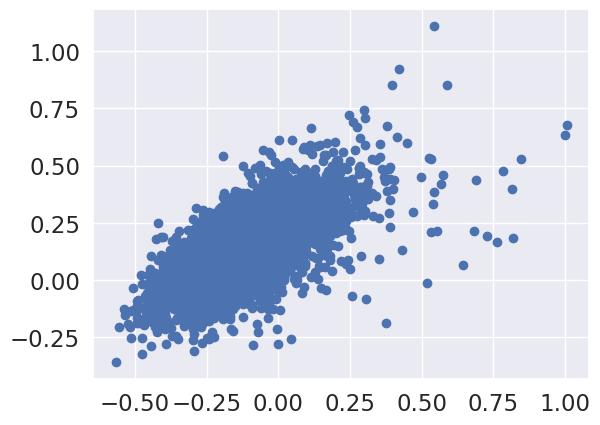

In [ ]:
plt.scatter(model1.A_[:, 0], model1.A_[:, 1], cmap = 'hot')


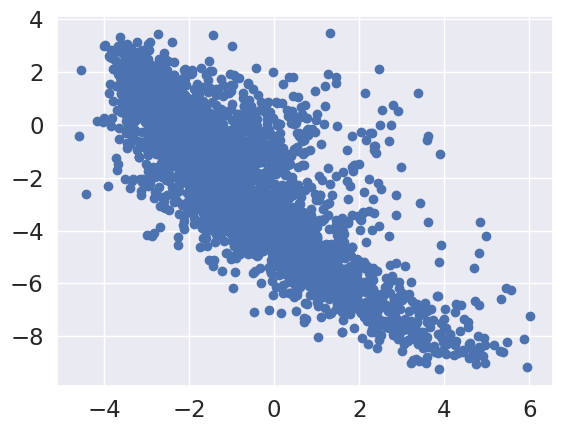

In [ ]:
plt.scatter(model1.B_[:, 0], model1.B_[:, 1], cmap='hot')

# Questionnaire

Users of which age group have watched and rated the most number of movies? :- 25-34 age group

Users belonging to which profession have watched and rated the most movies? :- college/grad student

Most of the users in our dataset who’ve rated the movies are Male. (T/F):- True

Most of the movies present on our dataset were released in which decade? :- b.90s a.70s b. 90s c. 50s d.80s

The movie with maximum no. of ratings is ___ :- American Beauty

Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach. :- Mrs. Doubtfire, Ace Ventura: Pet, Detective Dumb & Dumber

On the basis of approach, Collaborative Filtering methods can be classified into Memory-based and Model-based.

Pearson Correlation ranges between -1 to 1 whereas, Cosine Similarity belongs to the interval between -1 to 1

Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.:- RMSE:0.701 and MAPE: 0.54

Give the sparse ‘row’ matrix representation for the following dense matrix - [[1 0],[ 3 7]]

In [ ]:
from scipy.sparse import csr_matrix

A = np.array([[1,0],[3,7]])

S = csr_matrix(A)
print(S)

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 3 stored elements and shape (2, 2)>
  Coords	Values
  (0, 0)	1
  (1, 0)	3
  (1, 1)	7
